## Proyecto; exploración gráfica de estimaciones estadisticas del CONEVAL y censos de población y vivienda; 1992, 2000, 2010.
## Autor : Isaac Santiago Fernández Paz. 

### Descripción:

Documentación en Jupyter Notebook del codigo necesario para el proyecto, esta libreta contiene explicaciones de las lineas de código (en _Python 3.7_ ) y una pequeña descripción de los hallazgos encontrados al momento de la realización de los mismos. 

### Importación de bibiliotecas. 

In [1]:
import pandas as pd 
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from networkx.drawing.nx_pydot import graphviz_layout
import sys, networkx as nx, matplotlib.pyplot as plt
from numpy import mean
from sklearn.preprocessing import StandardScaler
import numpy

### Carga de datos.

In [2]:
datos = pd.read_csv('/Users/isaacfernandez/Desktop/datos_madi_proy.csv')

### Exploración de datos.

In [3]:
datos.shape

(2456, 139)

In [4]:
datos.head()

,ent,nom_ent,mun,clave_mun,nom_mun,pobtot_ajustada,pobreza,pobreza_e,pobreza_m,vul_car,...,pobreza_alim_10,pobreza_cap_90,pobreza_cap_00,pobreza_cap_10,pobreza_patrim_90,pobreza_patrim_00,pobreza_patrim_10,gini_90,gini_00,gini_10
0,1,Aguascalientes,1,1001,Aguascalientes,794304,30.531104,2.264478,28.266627,27.983320,...,11.805700,20.4,12.7,18.474600,43.4,33.7,41.900398,0.473,0.425,0.422628
1,1,Aguascalientes,2,1002,Asientos,48592,67.111172,8.040704,59.070468,22.439389,...,21.993299,39.9,29.0,30.980801,64.2,48.9,59.175800,0.379,0.533,0.343879
2,1,Aguascalientes,3,1003,Calvillo,53104,61.360527,7.241238,54.119289,29.428583,...,19.266800,39.5,33.1,28.259199,63.9,57.9,56.504902,0.414,0.465,0.386781
3,1,Aguascalientes,4,1004,Cosío,14101,52.800458,4.769001,48.031458,27.128568,...,14.303200,35.2,21.0,22.386101,59.7,40.1,51.164501,0.392,0.541,0.344984
4,1,Aguascalientes,5,1005,Jesús María,101379,45.338512,6.084037,39.254475,26.262912,...,15.085100,36.6,22.6,22.139999,60.6,42.2,45.703899,0.391,0.469,0.458083


In [5]:
datos.columns

Index(['ent', 'nom_ent', 'mun', 'clave_mun', 'nom_mun', 'pobtot_ajustada',
       'pobreza', 'pobreza_e', 'pobreza_m', 'vul_car',
       ...
       'pobreza_alim_10', 'pobreza_cap_90', 'pobreza_cap_00', 'pobreza_cap_10',
       'pobreza_patrim_90', 'pobreza_patrim_00', 'pobreza_patrim_10',
       'gini_90', 'gini_00', 'gini_10'],
      dtype='object', length=139)

In [6]:
print(datos.columns.tolist())

['ent', 'nom_ent', 'mun', 'clave_mun', 'nom_mun', 'pobtot_ajustada', 'pobreza', 'pobreza_e', 'pobreza_m', 'vul_car', 'vul_ing', 'npnv', 'ic_rezedu', 'ic_asalud', 'ic_segsoc', 'ic_cv', 'ic_sbv', 'ic_ali', 'carencias', 'carencias3', 'plb', 'plb_m', 'rankin_p', 'rankin_pe', 'N_pobreza', 'N_pobreza_e', 'N_pobreza_m', 'N_vul_car', 'N_vul_ing', 'N_npnv', 'N_ic_rezedu', 'N_ic_asalud', 'N_ic_segsoc', 'N_ic_cv', 'N_ic_sbv', 'N_ic_ali', 'N_carencias', 'N_carencias3', 'N_plb', 'N_plb_m', 'perrankin_p', 'perrankin_pe', 'cppobreza', 'cppobreza_e', 'cppobreza_m', 'cpvul_car', 'cpic_rezedu', 'cpic_asalud', 'cpic_segsoc', 'cpic_cv', 'cpic_sbv', 'cpic_ali', 'cpcarencias', 'cpcarencias3', 'cpplb', 'cpplbm', 'pobtot_00', 'pobtot_05', 'pobtot_10', 'porc_pob_15_analfa00', 'porc_pob_15_analfa05', 'porc_pob_15_analfa10', 'porc_pob614_noasiste00', 'porc_pob614_noasiste05', 'porc_pob614_noasiste10', 'porc_pob15_basicainc00', 'porc_pob15_basicainc05', 'porc_pob15_basicainc10', 'porc_pob_snservsal00', 'porc_pob_

El diccionario con la descripción de las columnas de la tabla de datos se encuentra disponible en: https://www.coneval.org.mx/Informes/Pobreza/Datos_abiertos/Indicadores_municipales/Indicadores_municipales_sabana_DIC.txt

* _gini_92:_ Se refiere a el coeficiente gini por municipio en el año 1992.

* _gini_00:_ Se refiere a el coeficiente gini por municipio en el año 2000.

* _gini_10:_ Se refiere a el coeficiente gini por municipio en el año 2010.

In [7]:
datos['gini_90'].describe()

count    2454.000000
mean        0.400882
std         0.036804
min         0.138000
25%         0.377000
50%         0.396000
75%         0.417000
max         0.617000
Name: gini_90, dtype: float64

In [8]:
datos[datos['gini_90'].isna()]

,ent,nom_ent,mun,clave_mun,nom_mun,pobtot_ajustada,pobreza,pobreza_e,pobreza_m,vul_car,...,pobreza_alim_10,pobreza_cap_90,pobreza_cap_00,pobreza_cap_10,pobreza_patrim_90,pobreza_patrim_00,pobreza_patrim_10,gini_90,gini_00,gini_10
655,14,Jalisco,125,14125,San Ignacio Cerro Gordo,19006,70.095212,14.931804,55.163407,24.293850,...,17.909500,NaN,NaN,25.859501,NaN,NaN,51.226002,NaN,NaN,0.417816
1811,23,Quintana Roo,9,23009,Tulum,23591,47.909783,10.311235,37.598547,43.274426,...,23.204399,NaN,NaN,32.581699,NaN,NaN,59.588501,NaN,NaN,0.391811


In [9]:
datos['gini_00'].describe()

count    2453.000000
mean        0.460919
std         0.069346
min         0.243000
25%         0.415000
50%         0.461000
75%         0.505000
max         0.705000
Name: gini_00, dtype: float64

In [10]:
datos[datos['gini_00'].isna()]

,ent,nom_ent,mun,clave_mun,nom_mun,pobtot_ajustada,pobreza,pobreza_e,pobreza_m,vul_car,...,pobreza_alim_10,pobreza_cap_90,pobreza_cap_00,pobreza_cap_10,pobreza_patrim_90,pobreza_patrim_00,pobreza_patrim_10,gini_90,gini_00,gini_10
137,7,Chiapas,58,7058,Nicolás Ruíz,4867,95.765830,55.476740,40.289089,3.786568,...,66.019897,53.7,NaN,76.520500,76.6,NaN,92.996597,0.354,NaN,0.308944
655,14,Jalisco,125,14125,San Ignacio Cerro Gordo,19006,70.095212,14.931804,55.163407,24.293850,...,17.909500,NaN,NaN,25.859501,NaN,NaN,51.226002,NaN,NaN,0.417816
1811,23,Quintana Roo,9,23009,Tulum,23591,47.909783,10.311235,37.598547,43.274426,...,23.204399,NaN,NaN,32.581699,NaN,NaN,59.588501,NaN,NaN,0.391811


In [11]:
datos['gini_10'].describe()

count    2456.000000
mean        0.374112
std         0.048742
min         0.252070
25%         0.335277
50%         0.375750
75%         0.409234
max         0.565479
Name: gini_10, dtype: float64

In [12]:
datos[datos['gini_10'].isna()]

,ent,nom_ent,mun,clave_mun,nom_mun,pobtot_ajustada,pobreza,pobreza_e,pobreza_m,vul_car,...,pobreza_alim_10,pobreza_cap_90,pobreza_cap_00,pobreza_cap_10,pobreza_patrim_90,pobreza_patrim_00,pobreza_patrim_10,gini_90,gini_00,gini_10


* _'N_pobreza_e:'_ Número de personas en pobreza extrema.

In [13]:
datos[['N_pobreza_e','gini_00','nom_ent']]

,N_pobreza_e,gini_00,nom_ent
0,17987,0.425,Aguascalientes
1,3907,0.533,Aguascalientes
2,3845,0.465,Aguascalientes
3,672,0.541,Aguascalientes
4,6168,0.469,Aguascalientes
...,...,...,...
2451,2585,0.589,Zacatecas
2452,2794,0.463,Zacatecas
2453,4155,0.498,Zacatecas
2454,2988,0.483,Zacatecas


Veamos las entidades que son parte de la republica, y el conteo de municipios correspondiente.

In [14]:
MyList = list(datos['nom_ent'])
res = {i:MyList.count(i) for i in MyList}

print(res)

{'Aguascalientes': 11, 'Baja California': 5, 'Baja California Sur': 5, 'Campeche': 11, 'Coahuila de Zaragoza': 38, 'Colima': 10, 'Chiapas': 118, 'Chihuahua': 67, 'Distrito Federal': 16, 'Durango': 39, 'Guanajuato': 46, 'Guerrero': 81, 'Hidalgo': 84, 'Jalisco': 125, 'México': 125, 'Michoacán de Ocampo': 113, 'Morelos': 33, 'Nayarit': 20, 'Nuevo León': 51, 'Oaxaca': 570, 'Puebla': 217, 'Querétaro': 18, 'Quintana Roo': 9, 'San Luis Potosí': 58, 'Sinaloa': 18, 'Sonora': 72, 'Tabasco': 17, 'Tamaulipas': 43, 'Tlaxcala': 60, 'Veracruz de Ignacio de la Llave': 212, 'Yucatán': 106, 'Zacatecas': 58}


In [15]:
entidades = list(res.keys())

In [16]:
datos_g = datos[['gini_90','gini_00','gini_10','nom_ent']]

datos_g90 = datos[['gini_90','nom_ent']]

datos_g00 = datos[['gini_00','nom_ent']]

datos_g10 = datos[['gini_10','nom_ent']]


Obtendremos el promedio de datos gini por estado, considerando que la base datos nos nuestra el coeficiente gini por municipio.

Función para obtener el promedio del coeficiente gini, en cada entidad. Toma como argumento un dataframe y el indice de la entidad correspondiente. Regresa el promedio por entidad y el nombre de la entidad correspondiente.

Empezaremos por tomar en cuenta los valores del coeficiente en del año 1990, posteriormente del 2000 y 2010.

In [17]:
def avg_gini(df,i):
    filtro = df['nom_ent'] == entidades[i]
    x = df.where(filtro).dropna()
    m = x.iloc[:,0].values
    avg = np.mean(m)
    return entidades[i],avg

In [18]:
avg_gini_90 = []
for i in range(len(entidades)):
    avg_gini_90.append(avg_gini(datos_g90,i))

In [19]:
len(avg_gini_90) ## Verficaremos la longitud de nuestro arreglo para verficar que se trata
##del coeficiente gini de las 32 entidades federativas del país. 

32

In [20]:
values_sizes = []
for i in range(len(avg_gini_90)):
    values_sizes.append(avg_gini_90[i][1])
   
               

In [21]:
avg_gini_00 = []
for i in range(len(entidades)):
    avg_gini_00.append(avg_gini(datos_g00,i))
avg_gini_10 = []
for i in range(len(entidades)):
    avg_gini_10.append(avg_gini(datos_g10,i))

Antes de realizar la gráfica, definiremos las aristas de nuestra gráfica basados en la colindancia geográfica por estados. Por los propositos del proyecto ( y por la falta de datos facilmente accesibles), escribiremos la colindancia por estado de manera manual.

In [22]:
G = nx.Graph()

for i in range(len(entidades)):
    G.add_node(entidades[i],node_color = "tab:red")

In [23]:
entidades

['Aguascalientes',
 'Baja California',
 'Baja California Sur',
 'Campeche',
 'Coahuila de Zaragoza',
 'Colima',
 'Chiapas',
 'Chihuahua',
 'Distrito Federal',
 'Durango',
 'Guanajuato',
 'Guerrero',
 'Hidalgo',
 'Jalisco',
 'México',
 'Michoacán de Ocampo',
 'Morelos',
 'Nayarit',
 'Nuevo León',
 'Oaxaca',
 'Puebla',
 'Querétaro',
 'Quintana Roo',
 'San Luis Potosí',
 'Sinaloa',
 'Sonora',
 'Tabasco',
 'Tamaulipas',
 'Tlaxcala',
 'Veracruz de Ignacio de la Llave',
 'Yucatán',
 'Zacatecas']

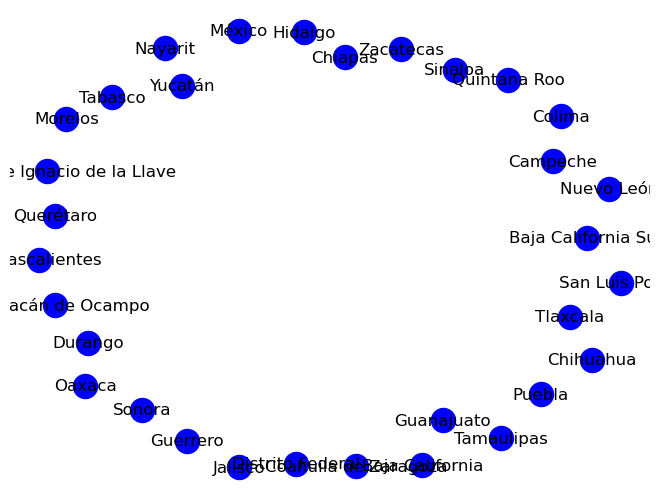

In [24]:

nx.draw(G,with_labels= True, node_color="blue")

Esta lista de duplas nos ayudará en un futuro para seguir utilizando las colindancias por estado.

In [25]:
edges = [('Baja California','Baja California Sur'),('Baja California','Sonora'),
        ('Sonora','Baja California'),('Sonora','Chihuahua'),('Sonora','Sinaloa'),
        ('Baja California Sur','Baja California'),
        ('Chihuahua','Sonora'),('Chihuahua','Coahuila de Zaragoza'),('Chihuahua','Durango'),('Chihuahua','Sinaloa'),
        ('Sinaloa','Sonora'),('Sinaloa','Chihuahua'),('Sinaloa','Durango'),('Sinaloa','Nayarit'),
        ('Durango','Chihuahua'),('Durango','Zacatecas'),('Durango','Sinaloa'),('Durango','Coahuila de Zaragoza'),('Durango','Nayarit'),('Durango','Jalisco'),
        ('Coahuila de Zaragoza','Chihuahua'),('Coahuila de Zaragoza','Durango'),('Coahuila de Zaragoza','Zacatecas'),('Coahuila de Zaragoza','San Luis Potosí'),('Coahuila de Zaragoza','Nuevo León'),
        ('Nuevo León','Coahuila de Zaragoza'),('Nuevo León','Tamaulipas'),('Nuevo León','San Luis Potosí'),('Nuevo León','Zacatecas'),
        ('Tamaulipas','Nuevo León'),('Tamaulipas','San Luis Potosí'),('Tamaulipas','Veracruz de Ignacio de la Llave'),
        ('San Luis Potosí','Coahuila de Zaragoza'),('San Luis Potosí','Nuevo León'),('San Luis Potosí','Tamaulipas'),('San Luis Potosí','Zacatecas'),('San Luis Potosí','Querétaro'),('San Luis Potosí','Hidalgo'),('San Luis Potosí','Guanajuato'),
        ('Aguascalientes','Zacatecas'),('Aguascalientes','Jalisco'),
        ('Nayarit','Sinaloa'),('Nayarit','Durango'),('Nayarit','Zacatecas'),('Nayarit','Jalisco'),
        ('Jalisco','Nayarit'),('Jalisco','Durango'),('Jalisco','Zacatecas'),('Jalisco','Aguascalientes'),('Jalisco','San Luis Potosí'),('Jalisco','Guanajuato'),('Jalisco','Michoacán de Ocampo'),('Jalisco','Colima'),
        ('Zacatecas','Durango'),('Zacatecas','Coahuila de Zaragoza'),('Zacatecas','Nuevo León'),('Zacatecas','Aguascalientes'),('Zacatecas','Nayarit'),('Zacatecas','Jalisco'),('Zacatecas','San Luis Potosí'),('Zacatecas','Guanajuato'),
        ('Guanajuato','Zacatecas'),('Guanajuato','San Luis Potosí'),('Guanajuato','Querétaro'),('Guanajuato','Michoacán de Ocampo'),('Guanajuato','Jalisco'),
        ('Querétaro','Guanajuato'),('Querétaro','San Luis Potosí'),('Querétaro','Hidalgo'),('Querétaro','México'),('Querétaro','Michoacán de Ocampo'),
        ('Colima','Jalisco'),('Colima','Michoacán de Ocampo'),
        ('Michoacán de Ocampo','Guanajuato'),('Michoacán de Ocampo','Querétaro'),('Michoacán de Ocampo','México'),('Michoacán de Ocampo','Guerrero'),('Michoacán de Ocampo','Colima'),('Michoacán de Ocampo','Jalisco'),
        ('Veracruz de Ignacio de la Llave','Tamaulipas'),('Veracruz de Ignacio de la Llave','San Luis Potosí'),('Veracruz de Ignacio de la Llave','Chiapas'),('Veracruz de Ignacio de la Llave','Hidalgo'),('Veracruz de Ignacio de la Llave','Puebla'),('Veracruz de Ignacio de la Llave','Tabasco'),('Veracruz de Ignacio de la Llave','Oaxaca'),
        ('Hidalgo','San Luis Potosí'),('Hidalgo','Veracruz de Ignacio de la Llave'),('Hidalgo','Puebla'),('Hidalgo','Tlaxcala'),('Hidalgo','México'),('Hidalgo','Querétaro'),
        ('Tlaxcala','Puebla'),('Tlaxcala','México'),('Tlaxcala','Hidalgo'),
        ('Morelos','México'),('Morelos','Distrito Federal'),('Morelos','Puebla'),('Morelos','Guerrero'),
        ('Puebla','Veracruz de Ignacio de la Llave'),('Puebla','Tlaxcala'),('Puebla','México'),('Puebla','Morelos'),('Puebla','Hidalgo'),('Puebla','Oaxaca'),('Puebla','Guerrero'),
        ('México','Querétaro'),('México','Hidalgo'),('México','Guerrero'),('México','Morelos'),('México','Puebla'),('México','Tlaxcala'),('México','Michoacán de Ocampo'),('México','Distrito Federal'),
        ('Distrito Federal','México'),('Distrito Federal','Morelos'),
        ('Oaxaca','Puebla'),('Oaxaca','Guerrero'),('Oaxaca','Veracruz de Ignacio de la Llave'),('Oaxaca','Chiapas'),
        ('Guerrero','México'),('Guerrero','Morelos'),('Guerrero','Michoacán de Ocampo'),('Guerrero','Puebla'),('Guerrero','Oaxaca'),
        ('Chiapas','Oaxaca'),('Chiapas','Veracruz de Ignacio de la Llave'),('Chiapas','Tabasco'),('Chiapas','Tabasco'),
        ('Tabasco','Chiapas'),('Tabasco','Veracruz de Ignacio de la Llave'),('Tabasco','Campeche'),
        ('Campeche','Tabasco'),('Campeche','Quintana Roo'),('Campeche','Yucatán'),
        ('Yucatán','Campeche'),('Yucatán','Quintana Roo'),
        ('Quintana Roo','Campeche'),('Quintana Roo','Yucatán')
        ]

In [26]:
for i in range(len(edges)):
    G.add_edge(edges[i][0],edges[i][1])

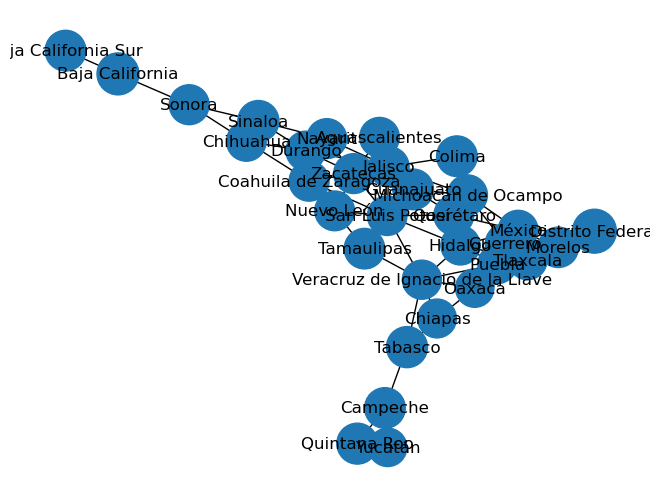

In [27]:
nx.draw(G,with_labels=True,node_size=[ values_sizes[i]*2000  for i in range(len(values_sizes))])

In [28]:
avg_gini_90

[('Aguascalientes', 0.4088181818181818),
 ('Baja California', 0.4558000000000001),
 ('Baja California Sur', 0.43),
 ('Campeche', 0.42863636363636365),
 ('Coahuila de Zaragoza', 0.4138157894736842),
 ('Colima', 0.42750000000000005),
 ('Chiapas', 0.39092372881355925),
 ('Chihuahua', 0.4079402985074627),
 ('Distrito Federal', 0.4993125),
 ('Durango', 0.4032307692307693),
 ('Guanajuato', 0.42760869565217385),
 ('Guerrero', 0.4092839506172839),
 ('Hidalgo', 0.39739285714285716),
 ('Jalisco', 0.4209435483870968),
 ('México', 0.4107040000000001),
 ('Michoacán de Ocampo', 0.41569911504424784),
 ('Morelos', 0.422969696969697),
 ('Nayarit', 0.41325),
 ('Nuevo León', 0.40915686274509805),
 ('Oaxaca', 0.3826719298245614),
 ('Puebla', 0.3921889400921659),
 ('Querétaro', 0.4116666666666666),
 ('Quintana Roo', 0.434),
 ('San Luis Potosí', 0.40444827586206894),
 ('Sinaloa', 0.4391111111111111),
 ('Sonora', 0.4129583333333333),
 ('Tabasco', 0.4365294117647059),
 ('Tamaulipas', 0.42520930232558146),
 ('

Nuestra grafica no nos permite apreciar de la mejor manera la diferencia dentro de nuestros datos, principalmente porque no es demasiada la diferencia entre estados de la república en términos de desigualdad.

Por lo cual trataremos de normalizar nuestro datos en busca de una mejor apreciación de las diferencais en coeficiente gini. 

Lo cual puede traducirse a una simple formula:

$$
\hat{X} = \frac{X - X_{min}}{X_{max}-X_{min}}
$$

Donde $\hat{X}$ es nuestro vector de coeficientes. 

In [29]:
values_90 = []
for i in range(len(avg_gini_90)):
     values_90.append(avg_gini_90[i][1])

In [30]:

from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
values_90 = np.array(values_90)
values_90_n = mms.fit_transform(values_90.reshape(-1,1))

In [31]:
values_90_n = list(values_90_n[:,-1])

In [32]:
values_90_n

[0.2262401381551986,
 0.627952045333092,
 0.4073525111669034,
 0.3956929163378238,
 0.2689715304322995,
 0.38597658731359097,
 0.07323595222580037,
 0.2187339114343887,
 1.0,
 0.17846569575297,
 0.3869059753072124,
 0.23022263350834082,
 0.12854939005155286,
 0.3299165031434512,
 0.2423645804974952,
 0.2850746600272456,
 0.34724082227031516,
 0.264133821349708,
 0.22913598523693102,
 0.002680021489135598,
 0.08405397620574018,
 0.2505957362426092,
 0.441553989332204,
 0.1888758273695963,
 0.48525587809897663,
 0.2616399635668212,
 0.46318139464261465,
 0.36639027568985805,
 0.12405026703099864,
 0.11817256017020039,
 0.0,
 0.2544778005745907]

Ahora crearemos una función que dado una lista de tuplas (que incluye el nombre del estado y su coeficiente gini) regresara la lista dividida en 4 regiones. 

In [33]:
class my_dictionary(dict):
 
  # __init__ function
  def __init__(self):
    self = dict()
 
  # Function to add key:value
  def add(self, key, value):
    self[key] = value

In [34]:
def quarts(list_q):
  reg_1,reg_2,reg_3,reg_4 = [],[],[],[]
  solo_valores = []
  for i in range(len(list_q)):
    solo_valores.append(list_q[i][1])
  quartiles = numpy.quantile(solo_valores, [0,0.25,0.5,0.75,1]) 
  for i in range(len(list_q)):
        if list_q[i][1] >= quartiles[0] and list_q[i][1] <= quartiles[1]:
            reg_1.append(list_q[i][0])
        elif list_q[i][1] > quartiles[1] and list_q[i][1] <= quartiles[2]:
            reg_2.append(list_q[i][0])
        elif list_q[i][1] > quartiles[2] and list_q[i][1] <= quartiles[3]:
            reg_3.append(list_q[i][0])
        else:
            reg_4.append(list_q[i][0])
  return reg_1,reg_2,reg_3,reg_4

In [35]:
r1,r2,r3,r4 = quarts(avg_gini_90)
r10,r20,r30,r40 = quarts(avg_gini_00)
r11,r21,r31,r41 = quarts(avg_gini_10)

In [36]:
values_00 = []
values_10 = []
for i in range(len(avg_gini_90)):
     values_00.append(avg_gini_00[i][1])
     values_10.append(avg_gini_10[i][1])

In [37]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
values_00,values_10 = np.array(values_00),np.array(values_10)
values_00_n,values_10_n = mms.fit_transform(values_00.reshape(-1,1)),mms.fit_transform(values_10.reshape(-1,1))
values_00_n,values_10_n = list(values_00_n[:,-1]),list(values_10_n[:,-1])

In [38]:
avg_gini_90_d = my_dictionary()
for i in range(len(avg_gini_90)):
     avg_gini_90_d.add(avg_gini_90[i][0],values_90_n[i])
avg_gini_00_d = my_dictionary()
for i in range(len(avg_gini_90)):
     avg_gini_00_d.add(avg_gini_00[i][0],values_00_n[i])
avg_gini_10_d = my_dictionary()
for i in range(len(avg_gini_90)):
     avg_gini_10_d.add(avg_gini_10[i][0],values_10_n[i])

In [39]:
avg_gini_90_d

{'Aguascalientes': 0.2262401381551986,
 'Baja California': 0.627952045333092,
 'Baja California Sur': 0.4073525111669034,
 'Campeche': 0.3956929163378238,
 'Coahuila de Zaragoza': 0.2689715304322995,
 'Colima': 0.38597658731359097,
 'Chiapas': 0.07323595222580037,
 'Chihuahua': 0.2187339114343887,
 'Distrito Federal': 1.0,
 'Durango': 0.17846569575297,
 'Guanajuato': 0.3869059753072124,
 'Guerrero': 0.23022263350834082,
 'Hidalgo': 0.12854939005155286,
 'Jalisco': 0.3299165031434512,
 'México': 0.2423645804974952,
 'Michoacán de Ocampo': 0.2850746600272456,
 'Morelos': 0.34724082227031516,
 'Nayarit': 0.264133821349708,
 'Nuevo León': 0.22913598523693102,
 'Oaxaca': 0.002680021489135598,
 'Puebla': 0.08405397620574018,
 'Querétaro': 0.2505957362426092,
 'Quintana Roo': 0.441553989332204,
 'San Luis Potosí': 0.1888758273695963,
 'Sinaloa': 0.48525587809897663,
 'Sonora': 0.2616399635668212,
 'Tabasco': 0.46318139464261465,
 'Tamaulipas': 0.36639027568985805,
 'Tlaxcala': 0.1240502670309

In [40]:
aux_90_1,ax_902,ax_903,ax_904 = [],[],[],[]
for i in range(len(r1)):
    aux_90_1.append(avg_gini_90_d[r1[i]] *10000)
for i in range(len(r2)):
    ax_902.append(avg_gini_90_d[r2[i]] *10000)
for i in range(len(r3)):
    ax_903.append(avg_gini_90_d[r3[i]] *10000)
for i in range(len(r4)):
    ax_904.append(avg_gini_90_d[r4[i]] *10000)


In [41]:
a01,a02,a03,a04 = [],[],[],[]
for i in range(len(r10)):
    a01.append(avg_gini_00_d[r10[i]] *10000)
for i in range(len(r20)):
    a02.append(avg_gini_00_d[r20[i]] *10000)
for i in range(len(r30)):
    a03.append(avg_gini_00_d[r30[i]] *10000)
for i in range(len(r40)):
    a04.append(avg_gini_00_d[r40[i]] *10000)


In [42]:
a11,a12,a13,a14 = [],[],[],[]
for i in range(len(r11)):
    a11.append(avg_gini_10_d[r11[i]] *10000)
for i in range(len(r21)):
    a12.append(avg_gini_10_d[r21[i]] *10000)
for i in range(len(r31)):
    a13.append(avg_gini_10_d[r31[i]] *10000)
for i in range(len(r41)):
    a14.append(avg_gini_10_d[r41[i]] *10000)

In [43]:
aux_90 = []
for i in range(len(values_90_n)):
    aux_90.append(values_90_n[i]*10000)

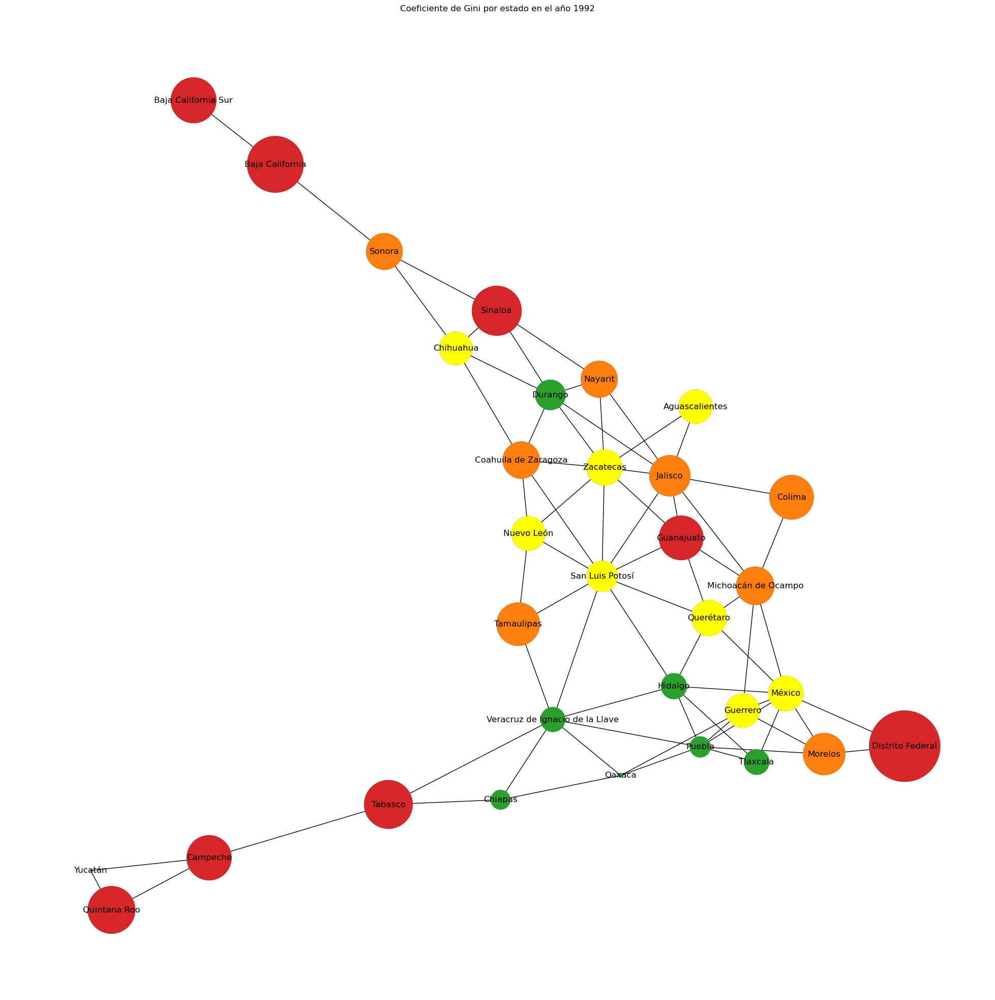

In [44]:
f = plt.figure(figsize=(25,25))
pos = nx.spring_layout(G,seed=5)
f.tight_layout()
ax = plt.gca()
ax.set_title('Coeficiente de Gini por estado en el año 1992')
nx.draw(G,pos, with_labels=True,node_size=[aux_90[i] for i in range(len(aux_90))])
nx.draw_networkx_nodes(G, pos, nodelist=r1, node_color="tab:green", node_size =[aux_90_1[i] for i in range(len(aux_90_1))] )
nx.draw_networkx_nodes(G, pos, nodelist=r2, node_color="yellow", node_size =[ax_902[i] for i in range(len(ax_902))] )
nx.draw_networkx_nodes(G, pos, nodelist=r3, node_color="tab:orange", node_size =[ax_903[i] for i in range(len(ax_903))] )
nx.draw_networkx_nodes(G, pos, nodelist=r4, node_color="tab:red", node_size =[ax_904[i] for i in range(len(ax_904))] )
plt.savefig("gini_90.png")

In [45]:
type(values_00)

numpy.ndarray

In [46]:
aux_00,aux_10 = [],[]
for i in range(len(values_00_n)):
    aux_00.append(values_00_n[i]*10000)
    aux_10.append(values_10_n[i]*10000)

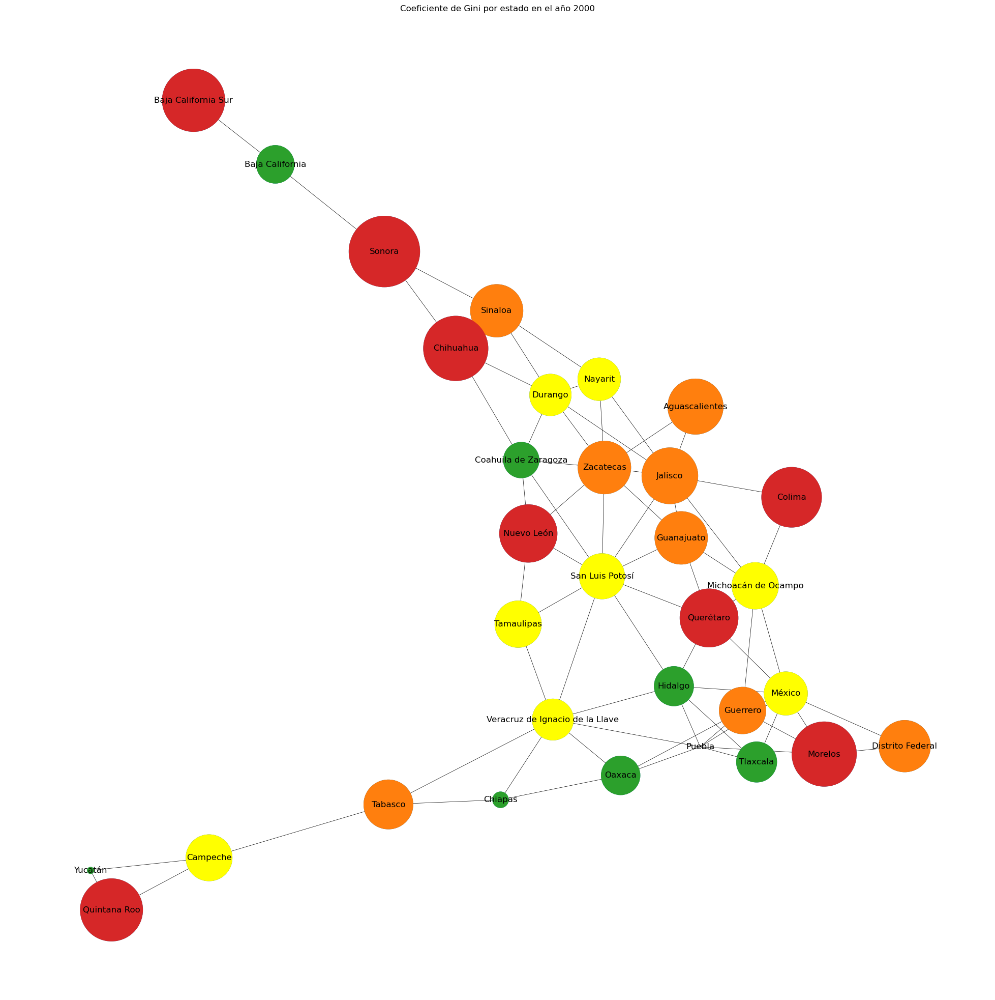

In [47]:
f = plt.figure(figsize=(25,25))
f.tight_layout()
pos = nx.spring_layout(G,seed=5)
ax = plt.gca()
ax.set_title('Coeficiente de Gini por estado en el año 2000')
nx.draw(G,pos,with_labels=True,node_size=[aux_00[i] for i in range(len(aux_00))],width = 0.5)
nx.draw_networkx_nodes(G, pos, nodelist=r10, node_color="tab:green", node_size =[a01[i] for i in range(len(a01))] )
nx.draw_networkx_nodes(G, pos, nodelist=r20, node_color="yellow", node_size =[a02[i] for i in range(len(a02))] )
nx.draw_networkx_nodes(G, pos, nodelist=r30, node_color="tab:orange", node_size =[a03[i] for i in range(len(a03))] )
nx.draw_networkx_nodes(G, pos, nodelist=r40, node_color="tab:red", node_size =[a04[i] for i in range(len(a04))] ) 
plt.savefig("gini_00")

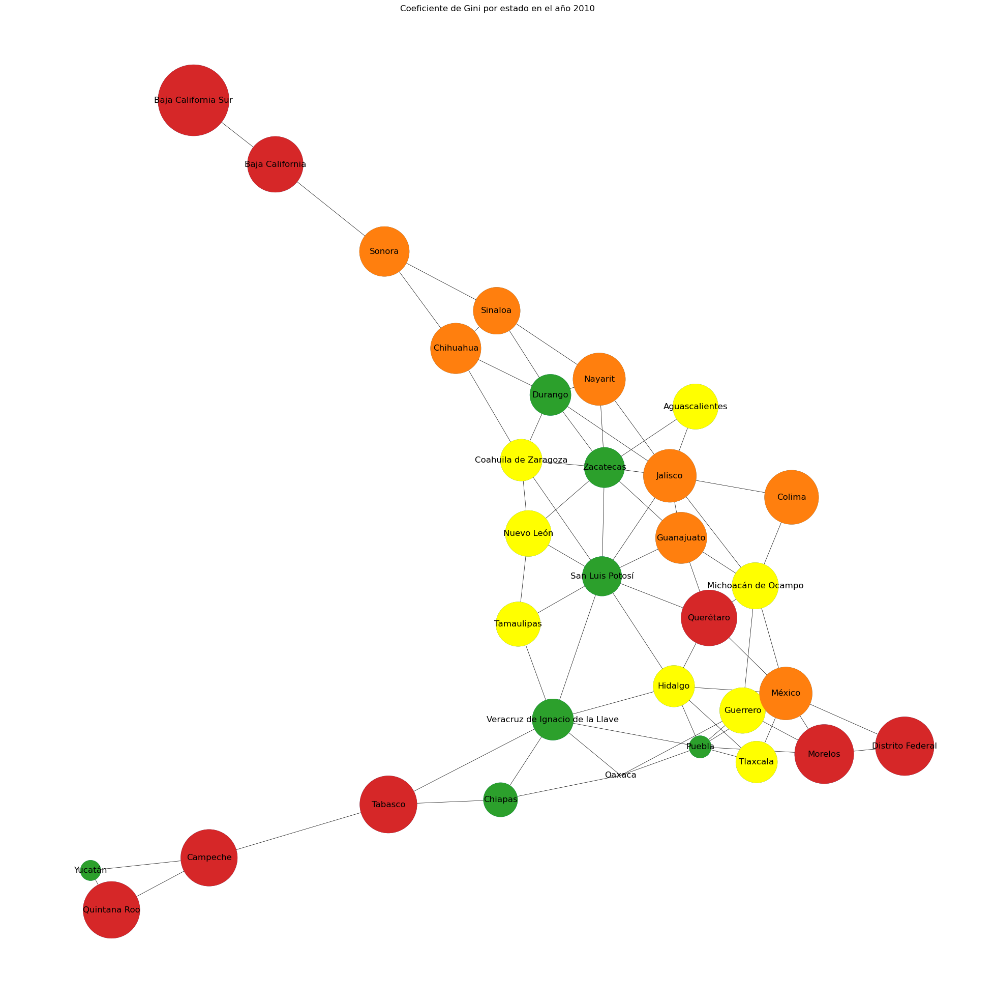

In [48]:
f = plt.figure(figsize=(25,25))
f.tight_layout()
pos = nx.spring_layout(G,seed=5)
ax = plt.gca()
ax.set_title('Coeficiente de Gini por estado en el año 2010')
nx.draw(G,pos,with_labels=True,node_size=[aux_10[i] for i in range(len(aux_10))],width = 0.5)
nx.draw_networkx_nodes(G, pos, nodelist=r11, node_color="tab:green", node_size =[a11[i] for i in range(len(a11))] )
nx.draw_networkx_nodes(G, pos, nodelist=r21, node_color="yellow", node_size =[a12[i] for i in range(len(a12))] )
nx.draw_networkx_nodes(G, pos, nodelist=r31, node_color="tab:orange", node_size =[a13[i] for i in range(len(a13))] )
nx.draw_networkx_nodes(G, pos, nodelist=r41, node_color="tab:red", node_size =[a14[i] for i in range(len(a14))] ) 
plt.savefig("gini_10")                               

Ahora que establecimos una relación entre el tamaño de los nodos y el coeficiente de gini, realicemos gráficas ponderadas utilizando el coeficiente gini y la relación que se tiene  del mismo entre dos estados, para lograr esto, obtendremos la media del coeficiente de los estados seleccionados. 

$$
\mu = \frac{G_i + G_j}{2}, \forall G \ donde \ G \ es \ el \ coeficiente \ de \ un \ estado \ con \ j \neq \ i \ y \ j \ es \ adyacente \ a \ i
$$


In [49]:
dict1 = [(n, nbrdict) for n, nbrdict in G.adjacency()]

Crearemos un diccionario para accesar de manera mas fácil al coeficiente gini por estado. 

In [50]:
def avg_gini_dic(df,i):
    filtro = df['nom_ent'] == entidades[i]
    x = df.where(filtro).dropna()
    m = x.iloc[:,0].values
    avg = np.mean(m)
    return entidades[i],avg

In [51]:
class my_dictionary(dict):
 
  # __init__ function
  def __init__(self):
    self = dict()
 
  # Function to add key:value
  def add(self, key, value):
    self[key] = value

Consideración: este diccionario es de los coeficientes gini en los años 90. 

In [52]:
n_90 = my_dictionary()

In [53]:
for i in range(len(entidades)):
     n_90.add(avg_gini_dic(datos_g90,i)[0],avg_gini_dic(datos_g90,i)[1])

In [54]:
G.adj['Aguascalientes']

AtlasView({'Zacatecas': {}, 'Jalisco': {}})

Pensemos en el algoritmo.

¿Qué es lo que queremos realizar? 
Basado en las adyacencias por estado, obtener el coeficiente gini de los estados correspondientes y tomar el del estado que estamos visitando para despues tomar el del adyacente, obtenemos la media y guardamos el valor en esa relación.



In [55]:
edges_test = edges.copy()

Aqui estaremos convirtiendo nuestras aristas a una lista, por la naturaleza de las mismas en Python, al ser tuplas, no pueden ser modificadas. 

In [56]:
edges_list = []
for i in range(len(edges_test)):
    edges_list.append(list(edges_test[i]))

In [57]:
n_90[entidades[0]]

0.4088181818181818

In [58]:
entidades[0]

'Aguascalientes'

In [59]:
if entidades[1] == edges_list[0][0]:
    print(True)

True


In [60]:
edges_list_c = edges_list.copy()

In [61]:
edges_list_c

[['Baja California', 'Baja California Sur'],
 ['Baja California', 'Sonora'],
 ['Sonora', 'Baja California'],
 ['Sonora', 'Chihuahua'],
 ['Sonora', 'Sinaloa'],
 ['Baja California Sur', 'Baja California'],
 ['Chihuahua', 'Sonora'],
 ['Chihuahua', 'Coahuila de Zaragoza'],
 ['Chihuahua', 'Durango'],
 ['Chihuahua', 'Sinaloa'],
 ['Sinaloa', 'Sonora'],
 ['Sinaloa', 'Chihuahua'],
 ['Sinaloa', 'Durango'],
 ['Sinaloa', 'Nayarit'],
 ['Durango', 'Chihuahua'],
 ['Durango', 'Zacatecas'],
 ['Durango', 'Sinaloa'],
 ['Durango', 'Coahuila de Zaragoza'],
 ['Durango', 'Nayarit'],
 ['Durango', 'Jalisco'],
 ['Coahuila de Zaragoza', 'Chihuahua'],
 ['Coahuila de Zaragoza', 'Durango'],
 ['Coahuila de Zaragoza', 'Zacatecas'],
 ['Coahuila de Zaragoza', 'San Luis Potosí'],
 ['Coahuila de Zaragoza', 'Nuevo León'],
 ['Nuevo León', 'Coahuila de Zaragoza'],
 ['Nuevo León', 'Tamaulipas'],
 ['Nuevo León', 'San Luis Potosí'],
 ['Nuevo León', 'Zacatecas'],
 ['Tamaulipas', 'Nuevo León'],
 ['Tamaulipas', 'San Luis Potosí']

In [62]:
test_list = [1, 4, 3, 6, 7]

In [63]:
while test_list:
    test_list.pop()

In [64]:
test_list

[]

In [65]:
n_90

{'Aguascalientes': 0.4088181818181818,
 'Baja California': 0.4558000000000001,
 'Baja California Sur': 0.43,
 'Campeche': 0.42863636363636365,
 'Coahuila de Zaragoza': 0.4138157894736842,
 'Colima': 0.42750000000000005,
 'Chiapas': 0.39092372881355925,
 'Chihuahua': 0.4079402985074627,
 'Distrito Federal': 0.4993125,
 'Durango': 0.4032307692307693,
 'Guanajuato': 0.42760869565217385,
 'Guerrero': 0.4092839506172839,
 'Hidalgo': 0.39739285714285716,
 'Jalisco': 0.4209435483870968,
 'México': 0.4107040000000001,
 'Michoacán de Ocampo': 0.41569911504424784,
 'Morelos': 0.422969696969697,
 'Nayarit': 0.41325,
 'Nuevo León': 0.40915686274509805,
 'Oaxaca': 0.3826719298245614,
 'Puebla': 0.3921889400921659,
 'Querétaro': 0.4116666666666666,
 'Quintana Roo': 0.434,
 'San Luis Potosí': 0.40444827586206894,
 'Sinaloa': 0.4391111111111111,
 'Sonora': 0.4129583333333333,
 'Tabasco': 0.4365294117647059,
 'Tamaulipas': 0.42520930232558146,
 'Tlaxcala': 0.3968666666666667,
 'Veracruz de Ignacio de l

In [66]:
def add_avg(dic,edges):
    for i in range(len(edges)):
        avg = (dic[edges[i][0]] + dic[edges[i][1]]) / 2
        edges[i].append(avg)
    
    return edges

In [67]:
avg_90_edges = add_avg(n_90,edges_list_c)

In [68]:
avg_90_edges

[['Baja California', 'Baja California Sur', 0.44290000000000007],
 ['Baja California', 'Sonora', 0.4343791666666667],
 ['Sonora', 'Baja California', 0.4343791666666667],
 ['Sonora', 'Chihuahua', 0.410449315920398],
 ['Sonora', 'Sinaloa', 0.4260347222222222],
 ['Baja California Sur', 'Baja California', 0.44290000000000007],
 ['Chihuahua', 'Sonora', 0.410449315920398],
 ['Chihuahua', 'Coahuila de Zaragoza', 0.4108780439905735],
 ['Chihuahua', 'Durango', 0.405585533869116],
 ['Chihuahua', 'Sinaloa', 0.4235257048092869],
 ['Sinaloa', 'Sonora', 0.4260347222222222],
 ['Sinaloa', 'Chihuahua', 0.4235257048092869],
 ['Sinaloa', 'Durango', 0.4211709401709402],
 ['Sinaloa', 'Nayarit', 0.42618055555555556],
 ['Durango', 'Chihuahua', 0.405585533869116],
 ['Durango', 'Zacatecas', 0.4076757294429708],
 ['Durango', 'Sinaloa', 0.4211709401709402],
 ['Durango', 'Coahuila de Zaragoza', 0.40852327935222676],
 ['Durango', 'Nayarit', 0.40824038461538464],
 ['Durango', 'Jalisco', 0.41208715880893304],
 ['Coa

In [69]:
avg_90_edges_t = []
for i in range(len(avg_90_edges)):
    avg_90_edges_t.append(tuple(avg_90_edges[i]))
    

In [70]:
G_avg_90 = nx.Graph()

In [71]:
for i in range(len(avg_90_edges)):
    G_avg_90.add_weighted_edges_from([(avg_90_edges_t[i])])

In [72]:
len(G_avg_90.edges)

70

### Creación de gráfica ponderada con datos de el coeficiente gini en 1992.

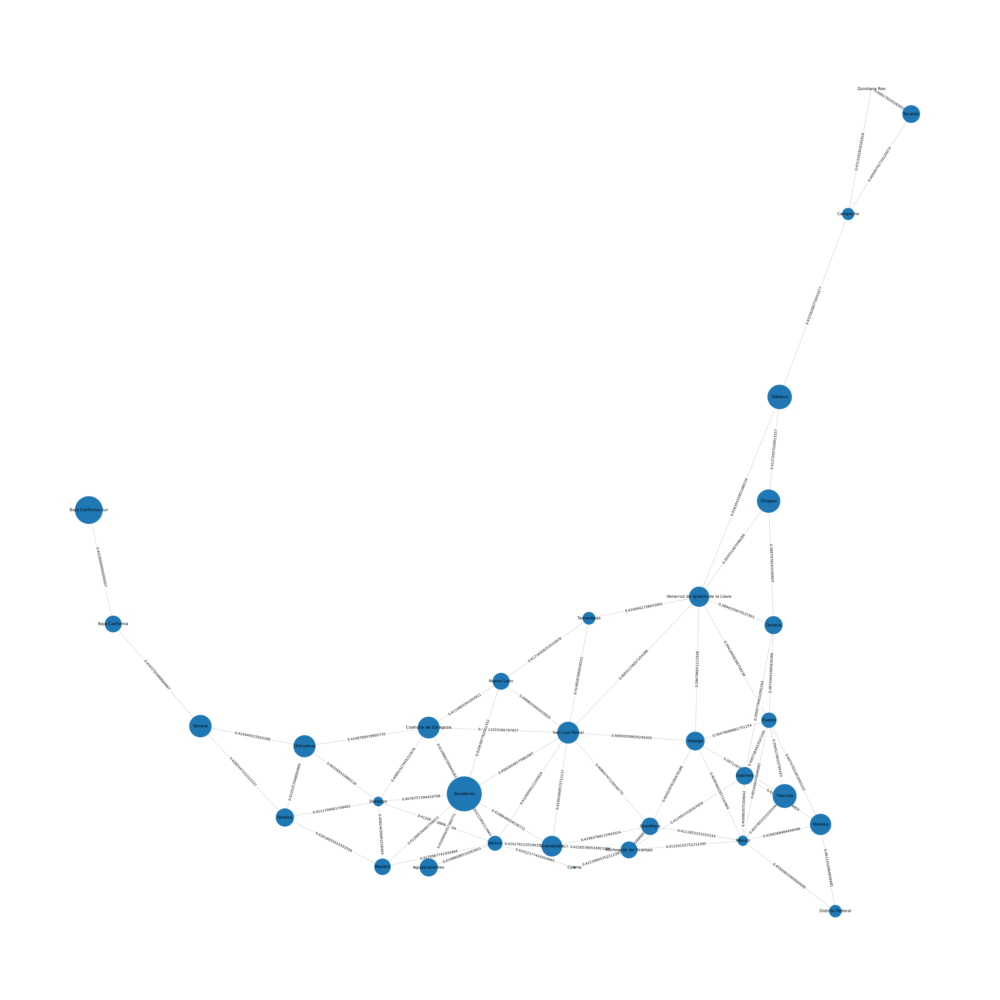

In [73]:
f = plt.figure(figsize=(40,40))
f.tight_layout()
pos = nx.spring_layout(G_avg_90,seed=5)
ax.set_title('Grafica ponderada de coeficiente gini con la media entre estados')
weight_labels_90 = nx.get_edge_attributes(G_avg_90,'weight')
nx.draw(G_avg_90,pos,font_color = 'black', node_shape = 'o', with_labels = True,node_size=[aux_90[i] for i in range(len(aux_90))],width = 0.25)
nx.draw_networkx_edge_labels(G_avg_90, pos, edge_labels = weight_labels_90,font_color = 'black')
plt.savefig("ponderada_92.jpeg")

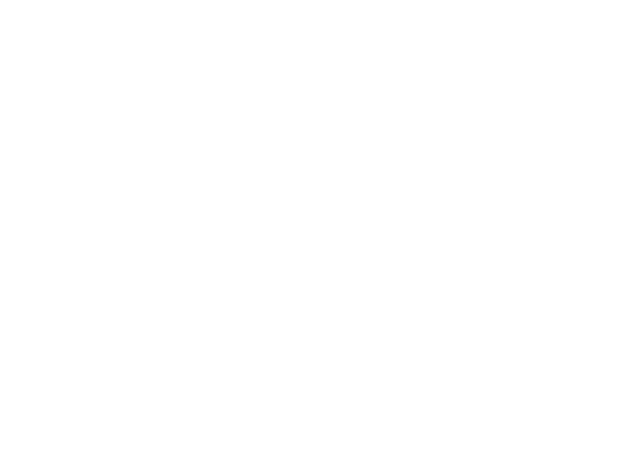

In [74]:
G_avg_90 = nx.Graph()

pos = nx.spring_layout(G_avg_90, seed=5)  # positions for all nodes - seed for reproducibility

# nodes
nx.draw_networkx_nodes(G_avg_90, pos, node_size=[aux_90[i] for i in range(len(aux_90))])

# edges
nx.draw_networkx_edges(
    G_avg_90, pos, width=6, alpha=0.5, edge_color="b", style="dashed"
)

# node labels
nx.draw_networkx_labels(G_avg_90, pos, font_size=20, font_family="sans-serif")
# edge weight labels
edge_labels_90 = nx.get_edge_attributes(G_avg_90, "weight")
nx.draw_networkx_edge_labels(G_avg_90, pos, edge_labels_90)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

### Creación de gráfica ponderada utilizando el coeficiente gini en el año 2000.

In [75]:
n_00  = my_dictionary()
for i in range(len(entidades)):
     n_00.add(avg_gini_dic(datos_g00,i)[0],avg_gini_dic(datos_g00,i)[1])

In [76]:
n_00

{'Aguascalientes': 0.4968181818181818,
 'Baja California': 0.44959999999999994,
 'Baja California Sur': 0.5214000000000001,
 'Campeche': 0.4699090909090909,
 'Coahuila de Zaragoza': 0.4450263157894737,
 'Colima': 0.5120000000000001,
 'Chiapas': 0.4155811965811966,
 'Chihuahua': 0.5287611940298508,
 'Distrito Federal': 0.4849375,
 'Durango': 0.4581282051282051,
 'Guanajuato': 0.4883478260869564,
 'Guerrero': 0.4710987654320988,
 'Hidalgo': 0.4530595238095237,
 'Jalisco': 0.4989758064516129,
 'México': 0.46242399999999995,
 'Michoacán de Ocampo': 0.4707433628318584,
 'Morelos': 0.5284545454545455,
 'Nayarit': 0.46075,
 'Nuevo León': 0.5041568627450981,
 'Oaxaca': 0.45175614035087713,
 'Puebla': 0.40842857142857136,
 'Querétaro': 0.5060555555555556,
 'Quintana Roo': 0.52075,
 'San Luis Potosí': 0.4675862068965517,
 'Sinaloa': 0.48788888888888887,
 'Sonora': 0.5533333333333333,
 'Tabasco': 0.47811764705882354,
 'Tamaulipas': 0.4706744186046512,
 'Tlaxcala': 0.45520000000000016,
 'Veracruz 

In [77]:
edges_list_00 = []
for i in range(len(edges_test)):
    edges_list_00.append(list(edges_test[i]))

In [78]:
edges_list_00

[['Baja California', 'Baja California Sur'],
 ['Baja California', 'Sonora'],
 ['Sonora', 'Baja California'],
 ['Sonora', 'Chihuahua'],
 ['Sonora', 'Sinaloa'],
 ['Baja California Sur', 'Baja California'],
 ['Chihuahua', 'Sonora'],
 ['Chihuahua', 'Coahuila de Zaragoza'],
 ['Chihuahua', 'Durango'],
 ['Chihuahua', 'Sinaloa'],
 ['Sinaloa', 'Sonora'],
 ['Sinaloa', 'Chihuahua'],
 ['Sinaloa', 'Durango'],
 ['Sinaloa', 'Nayarit'],
 ['Durango', 'Chihuahua'],
 ['Durango', 'Zacatecas'],
 ['Durango', 'Sinaloa'],
 ['Durango', 'Coahuila de Zaragoza'],
 ['Durango', 'Nayarit'],
 ['Durango', 'Jalisco'],
 ['Coahuila de Zaragoza', 'Chihuahua'],
 ['Coahuila de Zaragoza', 'Durango'],
 ['Coahuila de Zaragoza', 'Zacatecas'],
 ['Coahuila de Zaragoza', 'San Luis Potosí'],
 ['Coahuila de Zaragoza', 'Nuevo León'],
 ['Nuevo León', 'Coahuila de Zaragoza'],
 ['Nuevo León', 'Tamaulipas'],
 ['Nuevo León', 'San Luis Potosí'],
 ['Nuevo León', 'Zacatecas'],
 ['Tamaulipas', 'Nuevo León'],
 ['Tamaulipas', 'San Luis Potosí']

In [79]:
avg_00_edges = add_avg(n_00,edges_list_00)
avg_00_edges_t = []
for i in range(len(avg_90_edges)):
    avg_00_edges_t.append(tuple(avg_00_edges[i]))


In [80]:
G_avg_00 = nx.Graph()
for i in range(len(avg_00_edges_t)):
    G_avg_00.add_weighted_edges_from([(avg_00_edges_t[i])])
len(G_avg_00.edges)

70

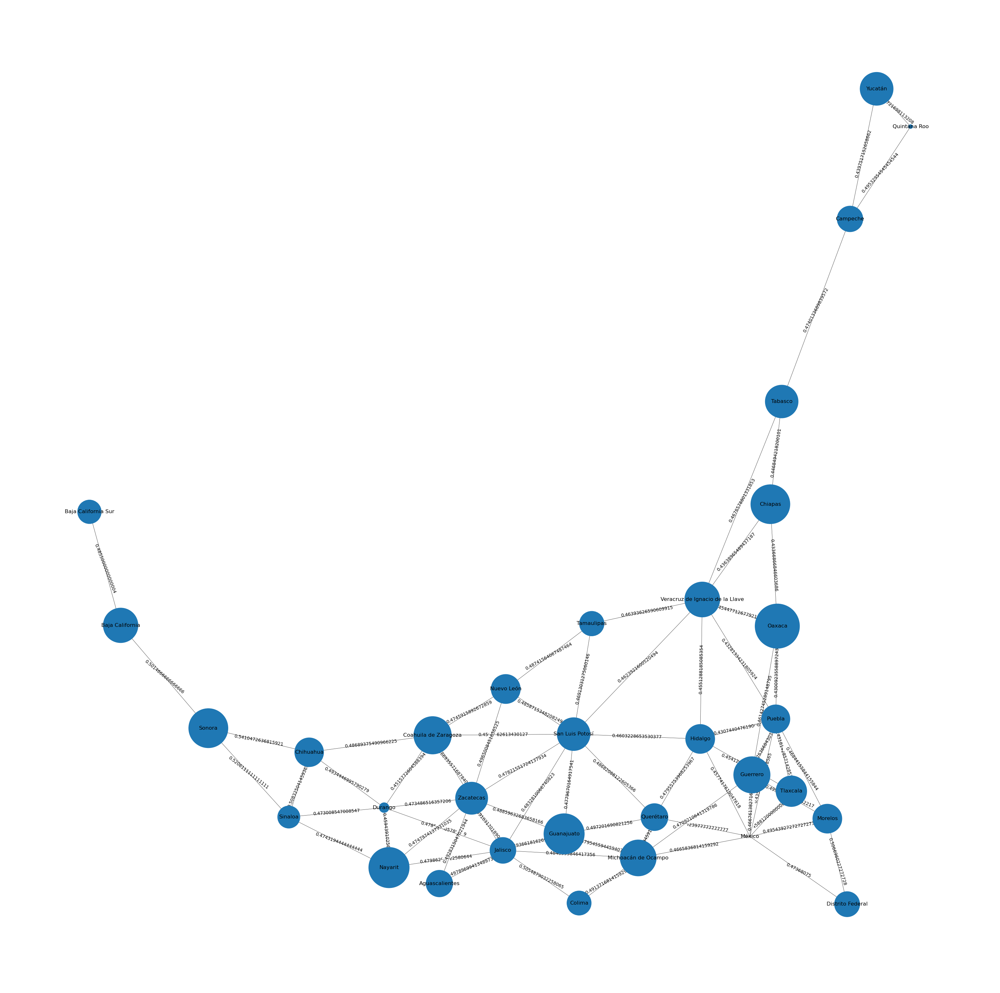

In [81]:
f = plt.figure(figsize=(40,40))
f.tight_layout()
pos = nx.spring_layout(G_avg_00,seed=5)
ax.set_title('Grafica ponderada de coeficiente gini con la media entre estados')
weight_labels_00 = nx.get_edge_attributes(G_avg_00,'weight')
nx.draw_networkx_edge_labels(G_avg_00, pos, edge_labels = weight_labels_00,font_color = 'black')
nx.draw(G_avg_00,pos,font_color = 'black', node_shape = 'o', with_labels = True,node_size=[aux_00[i] for i in range(len(aux_00))],width = 0.5)
plt.savefig("ponderada_00.jpeg")

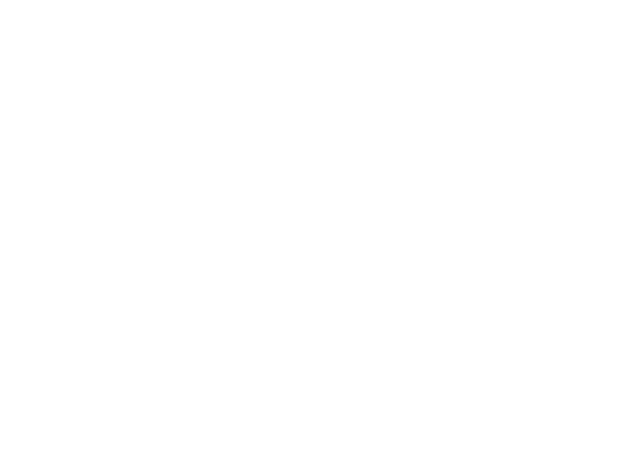

In [82]:
G_avg_00 = nx.Graph()

pos = nx.spring_layout(G_avg_00, seed=7)  # positions for all nodes - seed for reproducibility

# nodes
nx.draw_networkx_nodes(G_avg_00, pos, node_size=[aux_00[i] for i in range(len(aux_00))])

# edges
nx.draw_networkx_edges(
    G_avg_00, pos, width=6, alpha=0.5, edge_color="b", style="dashed"
)

# node labels
nx.draw_networkx_labels(G_avg_00, pos, font_size=20, font_family="sans-serif")
# edge weight labels
edge_labels_00 = nx.get_edge_attributes(G_avg_00, "weight")
nx.draw_networkx_edge_labels(G_avg_00, pos, edge_labels_00)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

### Creación de gráfica ponderada utilizando el coeficiente gini en el año 2010.

In [83]:
n_10  = my_dictionary()
for i in range(len(entidades)):
     n_10.add(avg_gini_dic(datos_g10,i)[0],avg_gini_dic(datos_g10,i)[1])

In [84]:
edges_list_10 = []
for i in range(len(edges_test)):
    edges_list_10.append(list(edges_test[i]))

In [85]:
avg_10_edges = add_avg(n_10,edges_list_10)
avg_10_edges_t = []
for i in range(len(avg_10_edges)):
    avg_10_edges_t.append(tuple(avg_00_edges[i]))


In [86]:
G_avg_10 = nx.Graph()
for i in range(len(avg_10_edges_t)):
    G_avg_10.add_weighted_edges_from([(avg_10_edges_t[i])])
len(G_avg_10.edges)

70

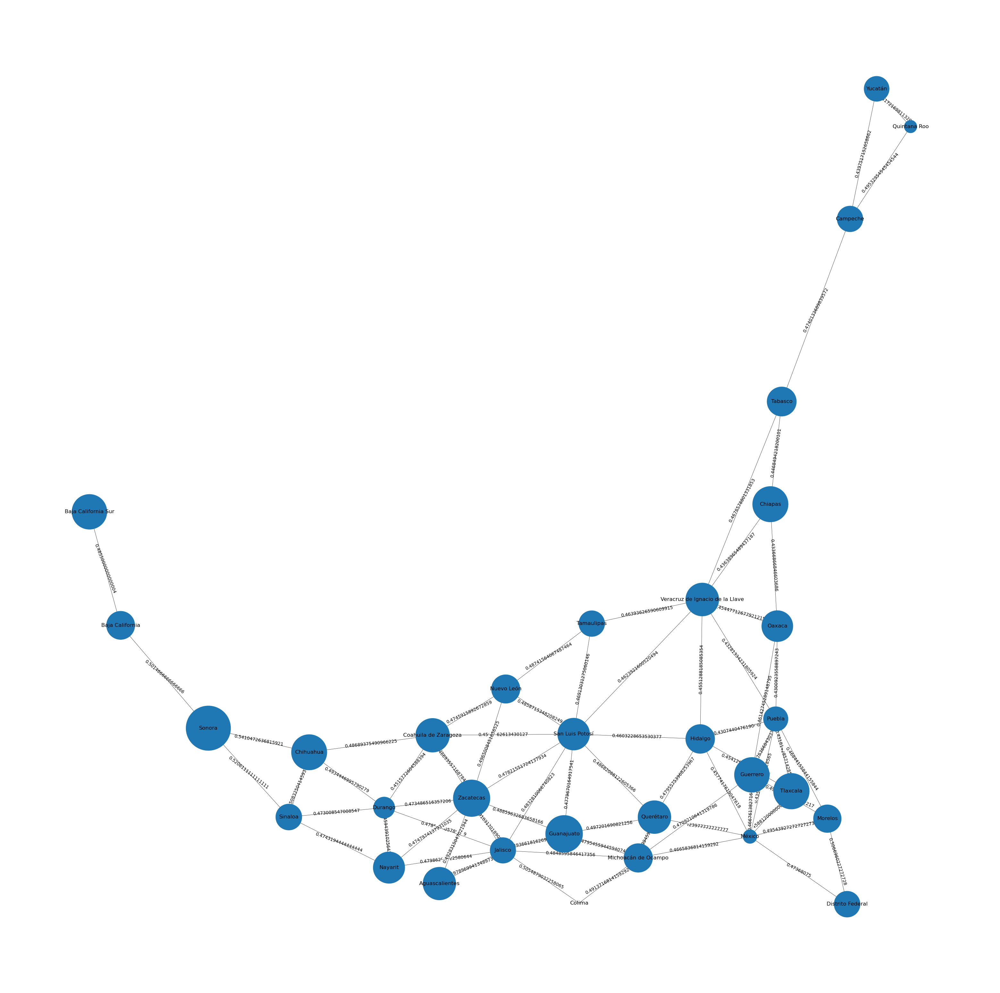

In [87]:
f = plt.figure(figsize=(40,40))
f.tight_layout()
pos = nx.spring_layout(G_avg_10,seed=5)
ax.set_title('Grafica ponderada de coeficiente gini con la media entre estados')
weight_labels_10 = nx.get_edge_attributes(G_avg_10,'weight')
nx.draw_networkx_edge_labels(G_avg_10, pos, edge_labels = weight_labels_10,font_color = 'black')
nx.draw(G_avg_10,pos, font_color = 'black', node_shape = 'o', with_labels = True,node_size=[aux_10[i] for i in range(len(aux_10))],width = 0.5)
plt.savefig("ponderada_10.jpeg")

## Obtención de métricas de educación. 

Ahora, obtengamos una métrica diferente y gráfiquemos a partir de las mismas.

* _ic_rezedu_: Porcentaje de personas con rezago educativo. 
* _nom_ent_: Nombre de la entidad de la república mexicana.

In [88]:
rezago = datos[['ic_rezedu','nom_ent']]

In [89]:
datos[['ic_rezedu']].idxmax()

ic_rezedu    1273
dtype: int64

In [90]:
datos.iloc[1273]

ent                                     20
nom_ent                             Oaxaca
mun                                    276
clave_mun                            20276
nom_mun              San Miguel Santa Flor
                             ...          
pobreza_patrim_00                     94.9
pobreza_patrim_10                89.581001
gini_90                              0.356
gini_00                              0.395
gini_10                           0.283523
Name: 1273, Length: 139, dtype: object

In [91]:
rezago

,ic_rezedu,nom_ent
0,14.970553,Aguascalientes
1,21.222712,Aguascalientes
2,27.361207,Aguascalientes
3,20.889023,Aguascalientes
4,20.578144,Aguascalientes
...,...,...
2451,27.350040,Zacatecas
2452,29.914879,Zacatecas
2453,11.936088,Zacatecas
2454,26.649950,Zacatecas


Realizaremos una gráfica con coloración utilizando el promedio por estado de el coeficiente de rezago educativo.


In [92]:
def avg_edu(df,i):
    filtro = df['nom_ent'] == entidades[i]
    x = df.where(filtro).dropna()
    m = x.iloc[:,0].values
    avg = np.mean(m)
    return entidades[i],avg

In [93]:
avg_rez = [] 
for i in range(len(entidades)):
    avg_rez.append(avg_edu(rezago,i))

In [94]:
avg_rez_d = my_dictionary()
for i in range(len(avg_rez)):
     avg_rez_d.add(avg_rez[i][0],avg_rez[i][1])

Ahora, consideraremos estos valores de rezago educativo y los dividiremos en quartiles. 

In [95]:
solo_valores_edu = []
for i in range(len(avg_rez)):
    solo_valores_edu.append(avg_rez[i][1])

Obtengamos los quartiles. 

In [96]:
quartiles = numpy.quantile(solo_valores_edu, [0,0.25,0.5,0.75,1]) 

Ahora, categorizemos los estados conforme a su porcentaje de rezago educativo. 

In [97]:
quartiles

array([ 9.00426455, 21.15720889, 24.35418009, 28.55061246, 38.51796935])

In [98]:
avg_rez

[('Aguascalientes', 20.969480487272723),
 ('Baja California', 17.369965328),
 ('Baja California Sur', 19.580666582),
 ('Campeche', 28.022868106363635),
 ('Coahuila de Zaragoza', 16.17062890676316),
 ('Colima', 22.951640959),
 ('Chiapas', 38.51796935474575),
 ('Chihuahua', 27.00290316731343),
 ('Distrito Federal', 9.004264545625),
 ('Durango', 24.667225582820514),
 ('Guanajuato', 27.99978727065218),
 ('Guerrero', 34.647281788765426),
 ('Hidalgo', 27.75282146630952),
 ('Jalisco', 26.89160512888),
 ('México', 22.91584505376),
 ('Michoacán de Ocampo', 36.35588286238938),
 ('Morelos', 21.90497614121212),
 ('Nayarit', 24.041134589000002),
 ('Nuevo León', 21.219785026196078),
 ('Oaxaca', 36.54536420833333),
 ('Puebla', 34.25551130382489),
 ('Querétaro', 26.329061890055556),
 ('Quintana Roo', 20.344437722222224),
 ('San Luis Potosí', 30.133845506206892),
 ('Sinaloa', 24.011325626666665),
 ('Sonora', 19.828314334305556),
 ('Tabasco', 21.849293681764706),
 ('Tamaulipas', 21.458731584069767),
 ('

In [99]:
reg_1,reg_2,reg_3,reg_4 = quarts(avg_rez)

In [100]:
reg_4_n= my_dictionary()
for i in range(len(reg_4)):
    reg_4_n.add(reg_4[i],avg_rez_d[reg_4[i]])

In [101]:
len(reg_1 + reg_2 + reg_3 + reg_4)

32

In [102]:
reg_4_n

{'Chiapas': 38.51796935474575,
 'Guerrero': 34.647281788765426,
 'Michoacán de Ocampo': 36.35588286238938,
 'Oaxaca': 36.54536420833333,
 'Puebla': 34.25551130382489,
 'San Luis Potosí': 30.133845506206892,
 'Veracruz de Ignacio de la Llave': 32.2763454340566,
 'Yucatán': 34.178029422358485}

Con esto verificamos que recorrimos todas las entidades de la republica, al ser 32.

In [103]:
len(reg_1) + len(reg_2) + len(reg_3) + len(reg_4)

32

Ahora, crearemos una gráfica de colores con la cual podamos identificar estas regiones.

In [104]:
G_edu = nx.Graph()

In [105]:
G_edu.add_nodes_from(entidades)

In [106]:
G_edu.add_edges_from(edges)

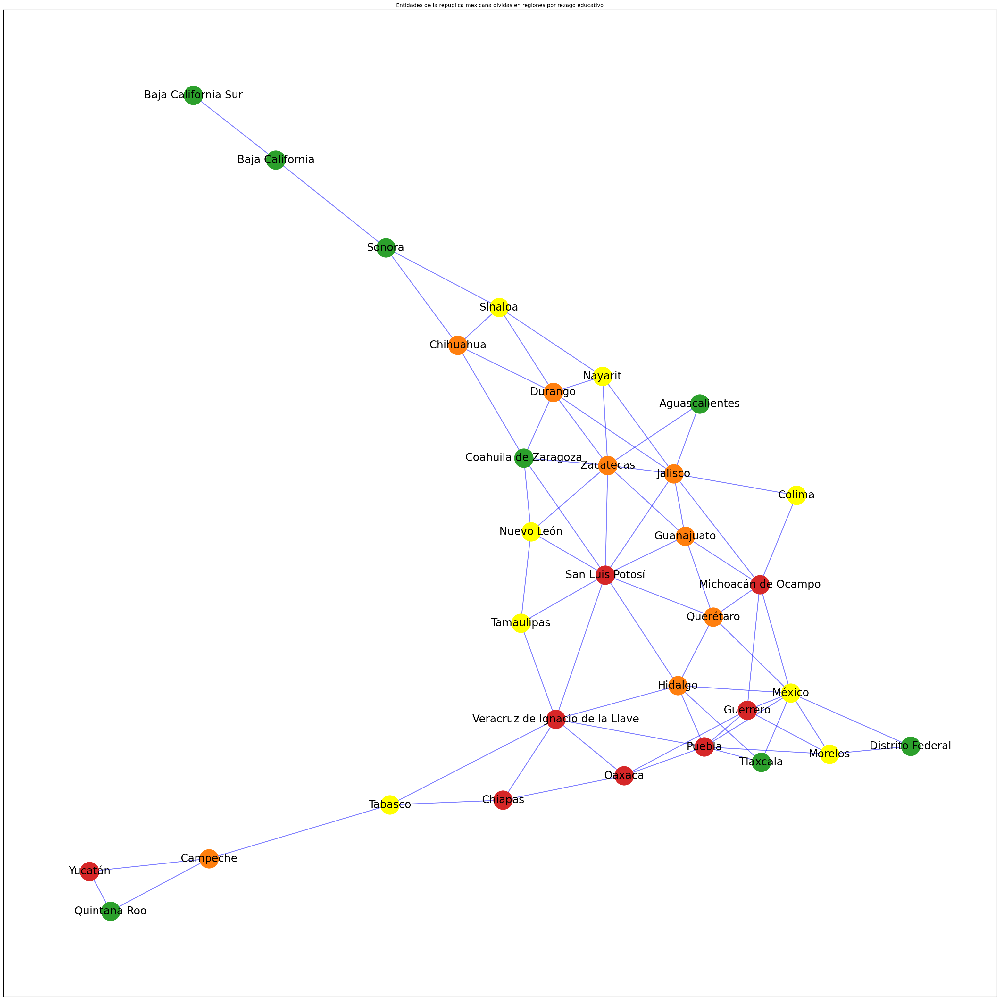

In [155]:
pos = nx.spring_layout(G_edu) # positions for all nodes

f = plt.figure(figsize=(40,40))
f.tight_layout()
pos = nx.spring_layout(G_edu,seed=5)
ax = plt.gca()
ax.set_title('Entidades de la repuplica mexicana dividas en regiones por rezago educativo')
options = {"node_size": 1800}
nx.draw_networkx_nodes(G_edu, pos, nodelist=reg_1, node_color="tab:green", **options )
nx.draw_networkx_nodes(G_edu, pos, nodelist=reg_2, node_color="yellow", **options)
nx.draw_networkx_nodes(G_edu, pos, nodelist=reg_3, node_color="tab:orange", **options)
nx.draw_networkx_nodes(G_edu, pos, nodelist=reg_4, node_color="tab:red", **options)

nx.draw_networkx_edges(
    G_edu, pos, width=2, alpha=0.5, edge_color="b"
)

# node labels
nx.draw_networkx_labels(G_edu, pos, font_size=24, font_family="sans-serif")
plt.savefig("rezago_edu.jpeg")

Ahora, encontraremos si existen caminos dentro de las regiones que hemos creado, o si es el caso, si podemos dividir la gráfica $G$ en componentes conexas.
Observemos que las regiones con mayor rezago educativo parecen formar un camino, veamos si podemos formar una trayectoria utilizando una subgafica de `G_edu`

Obtengamos los estados de la región 4. Es decir, los estados con mayor rezago educativo.

In [125]:
H = G_edu.subgraph(reg_4)

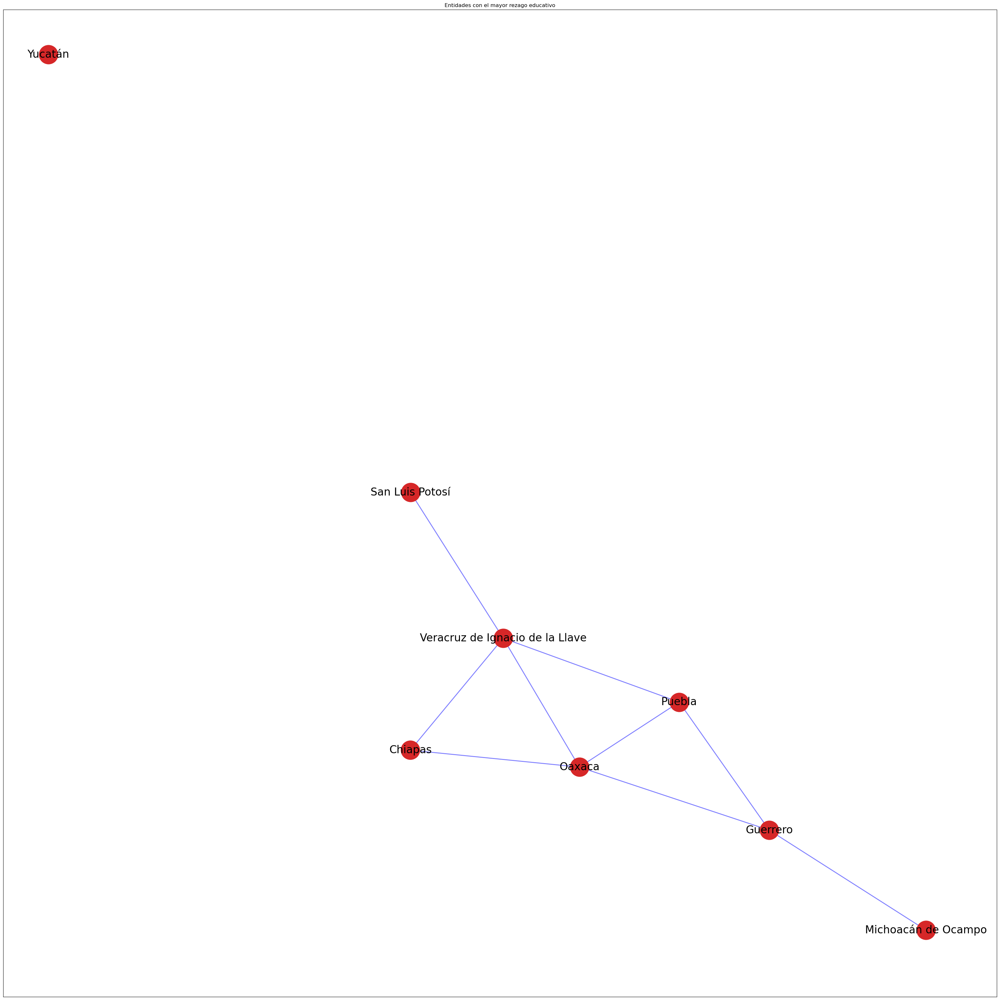

In [156]:
pos = nx.spring_layout(H) # positions for all nodes


f = plt.figure(figsize=(40,40))
f.tight_layout()
pos = nx.spring_layout(H,seed=5)
ax = plt.gca()
ax.set_title('Entidades con el mayor rezago educativo')
options = {"node_size": 1800}
nx.draw_networkx_nodes(H, pos,nodelist=reg_4, node_color="tab:red", **options )


nx.draw_networkx_edges(
    H, pos, width=2, alpha=0.5, edge_color="b"
)

# node labels
nx.draw_networkx_labels(H, pos, font_size=24, font_family="sans-serif")
plt.savefig("trayectoria.jpeg")

Ahora iremos más profundo y descubriremo que tipo de métricas cuentan con los estados de la república con mayor rezago educativo. Empezando por puebla. 

Obtendremo la media de pobreza en toda la republica y la compararemos con los valores obtenidos en puebla.

In [134]:
datos['pobreza'].describe() 

count    2456.000000
mean       67.421505
std        18.516378
min         8.745311
25%        55.622230
50%        69.862685
75%        82.551284
max        97.350405
Name: pobreza, dtype: float64

Tendremos en cuenta los siguiente indicadores para dividir a México en regiones de pobreza:

* Región 1: Pobreza menor a 55.62 % de la población. 
* Región 2: Pobreza entre el 55.62% de la población y el 69.86% de la población.
* Región 3: Pobreza entre el 69.86% de la población y el 82.55% de la población. 
* Región 4: Pobreza mayor al 82.55% de la población.

In [135]:
reg_pobreza = numpy.quantile(datos['pobreza'].values,[0,0.25,0.5,0.75,1])

In [136]:
reg_pobreza

array([ 8.74531074, 55.62223023, 69.86268487, 82.55128414, 97.35040502])

La media de la pobreza en México es del $67.42 $ %

In [137]:
datos_puebla = datos[datos['nom_ent'] == 'Puebla']

In [138]:
municipios = list(datos_puebla['nom_mun'].values)
##para considerar la diferencai al momento de graficar, entre el estado de puebla y el municipio de puebla
municipios.append('Estado de Puebla')

In [139]:
len(municipios)

218

In [140]:
p_puebla = datos_puebla[['nom_mun','pobreza']].values

In [141]:
dic_puebla = my_dictionary()
for i in range(len(p_puebla)):
     dic_puebla.add(p_puebla[i][0],p_puebla[i][1])

In [142]:
regp_1,regp_2,regp_3,regp_4 = quarts(p_puebla)

In [143]:
edges_1,edges_2,edges_3,edges_4 = [],[],[],[]
for i in range(len(regp_1)):
    edges_1.append(['Estado de Puebla',regp_1[i]])
for i in range(len(regp_2)):
    edges_2.append(['Estado de Puebla',regp_2[i]])
for i in range(len(regp_3)):
    edges_3.append(['Estado de Puebla',regp_3[i]])
for i in range(len(regp_4)):
    edges_4.append(['Estado de Puebla',regp_4[i]])

Comprobando que si estaremos considerando todos los municipios del estado de puebla.

In [144]:
len(edges_1)+ len(edges_2) + len(edges_3) + len(edges_4)

217

In [145]:
P_puebla = nx.Graph()

In [146]:
P_puebla.add_edges_from(edges_1)
P_puebla.add_edges_from(edges_2)
P_puebla.add_edges_from(edges_3)
P_puebla.add_edges_from(edges_4)

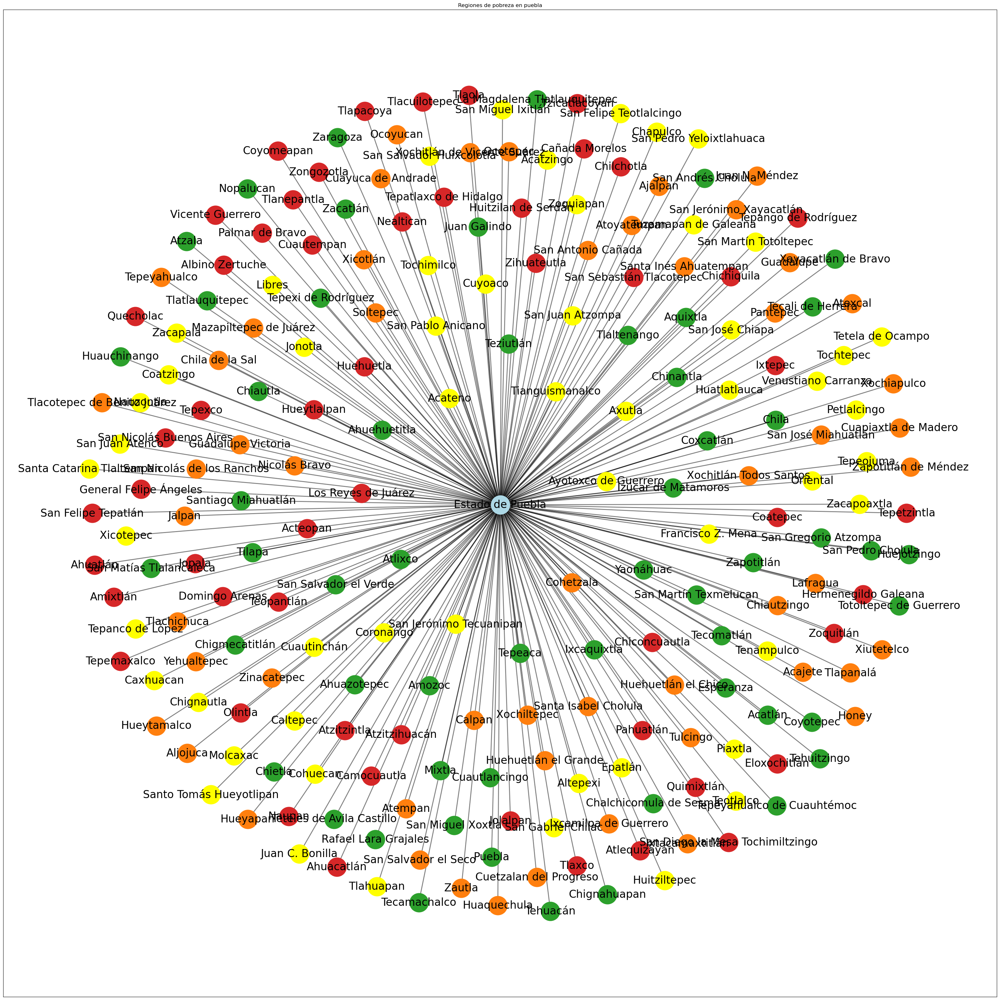

In [157]:
pos = nx.spring_layout(P_puebla) # positions for all nodes

f = plt.figure(figsize=(40,40))
f.tight_layout()
pos = nx.spring_layout(P_puebla,seed=2)
ax = plt.gca()
ax.set_title('Regiones de pobreza en puebla')
options = {"node_size": 1800}
nx.draw_networkx_nodes(P_puebla, pos, nodelist=regp_1, node_color="tab:green", **options )
nx.draw_networkx_nodes(P_puebla, pos, nodelist=regp_2, node_color="yellow", **options)
nx.draw_networkx_nodes(P_puebla, pos, nodelist=regp_3, node_color="tab:orange", **options)
nx.draw_networkx_nodes(P_puebla, pos, nodelist=regp_4, node_color="tab:red", **options)
nx.draw_networkx_nodes(P_puebla,pos, nodelist = ['Estado de Puebla'], node_color = "lightblue",**options)
nx.draw_networkx_edges(
    P_puebla, pos, width=2, alpha=0.5, edge_color="black"
)

# node labels
nx.draw_networkx_labels(P_puebla, pos, font_size=24, font_family="sans-serif")
plt.savefig("puebla.jpeg")

Aunque esta organización nos ayuda tener una idea de las regiones de pobreza en puebla, hagamoslo con un una visualización diferente. 

In [148]:
Reg_1,Reg_2, Reg_3, Reg_4 = nx.Graph(),nx.Graph(),nx.Graph(),nx.Graph()
Reg_1.add_edges_from(edges_1)
Reg_2.add_edges_from(edges_2)
Reg_3.add_edges_from(edges_3)
Reg_4.add_edges_from(edges_4)

In [149]:
vals_1,vals_2,vals_3,vals_4 = [],[],[],[]
for i in range(len(regp_1)):
    vals_1.append(dic_puebla[regp_1[i]] * 500)
for i in range(len(regp_2)):
    vals_2.append(dic_puebla[regp_2[i]]* 500)
for i in range(len(regp_3)):
    vals_3.append(dic_puebla[regp_3[i]]* 500)
for i in range(len(regp_4)):
    vals_4.append(dic_puebla[regp_4[i]]*600)

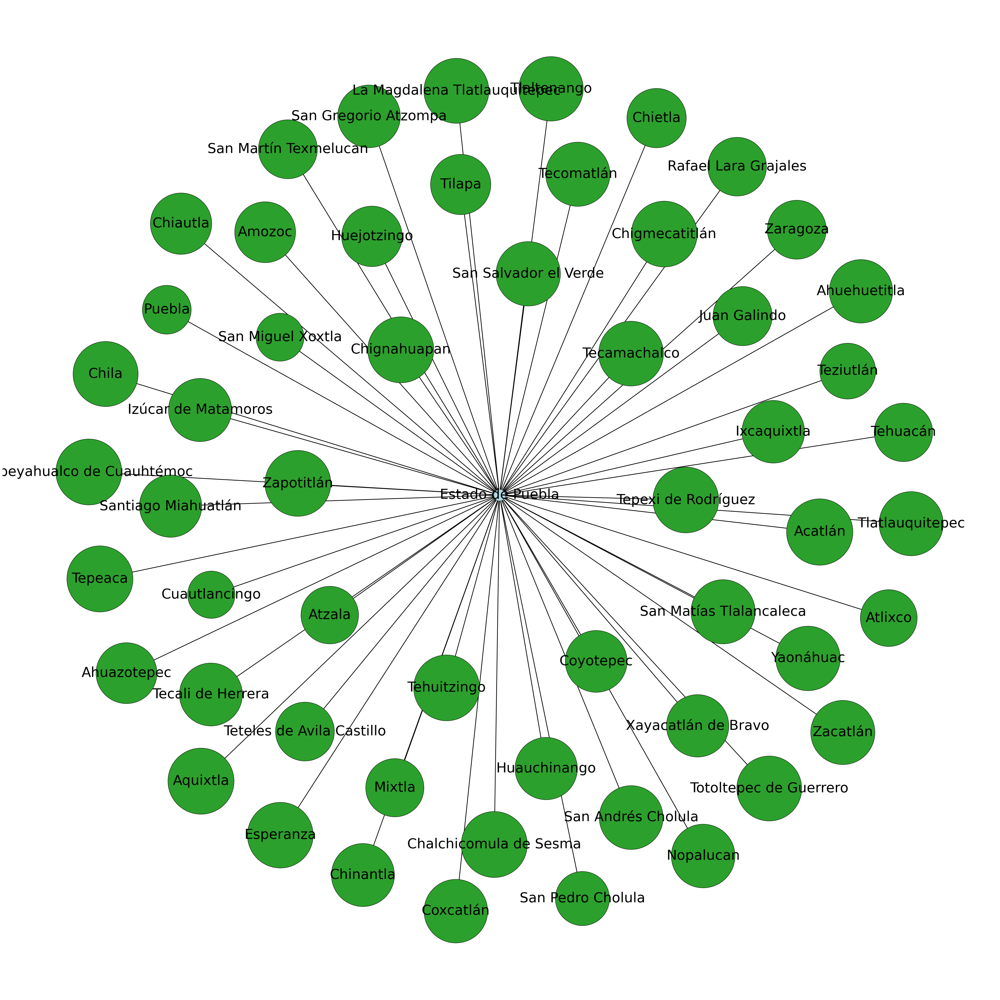

In [164]:
f = plt.figure(figsize=(40,40))
f.tight_layout() 
pos = nx.spring_layout(Reg_1, iterations=100, seed=39775)
nx.draw(Reg_1, pos,
        nodelist=regp_1, node_color="tab:green", with_labels  = True,
        node_size=[vals_1[i] for i in range(len(vals_1))],
        edgecolors= 'black'
       ,width = 2,
       font_size = 40)
nx.draw_networkx_nodes(Reg_1,pos, nodelist = ['Estado de Puebla'], node_color = "lightblue", node_size = 1000)
plt.savefig("pueblag.jpeg")

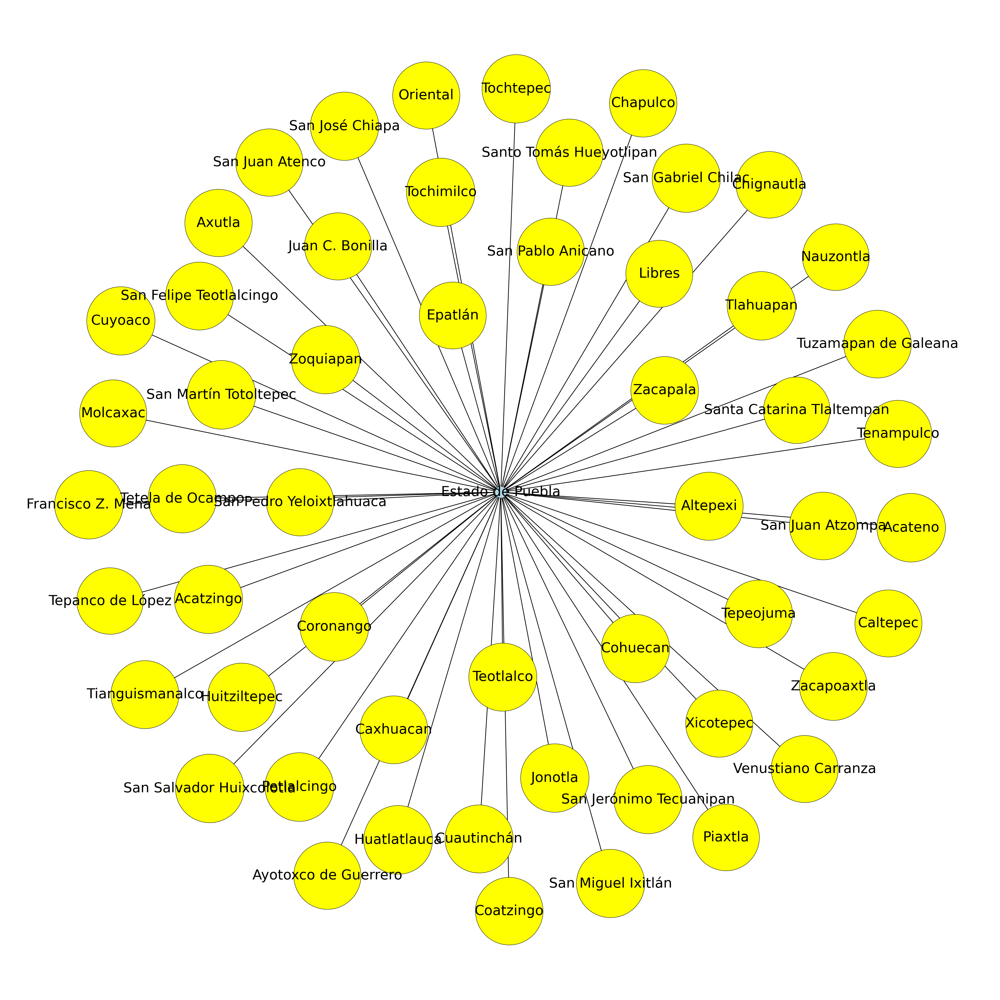

In [165]:
f = plt.figure(figsize=(40,40))
f.tight_layout() 
pos = nx.spring_layout(Reg_2, iterations=100, seed=39775)

nx.draw(Reg_2, pos,
        nodelist=regp_2, node_color="yellow", with_labels  = True,
        node_size=[vals_2[i] for i in range(len(vals_2))],
        edgecolors= 'black'
       ,width = 2,
       font_size = 40)
nx.draw_networkx_nodes(Reg_2,pos, nodelist = ['Estado de Puebla'], node_color = "lightblue", node_size = 1000)

plt.savefig("puebla_2.jpeg")

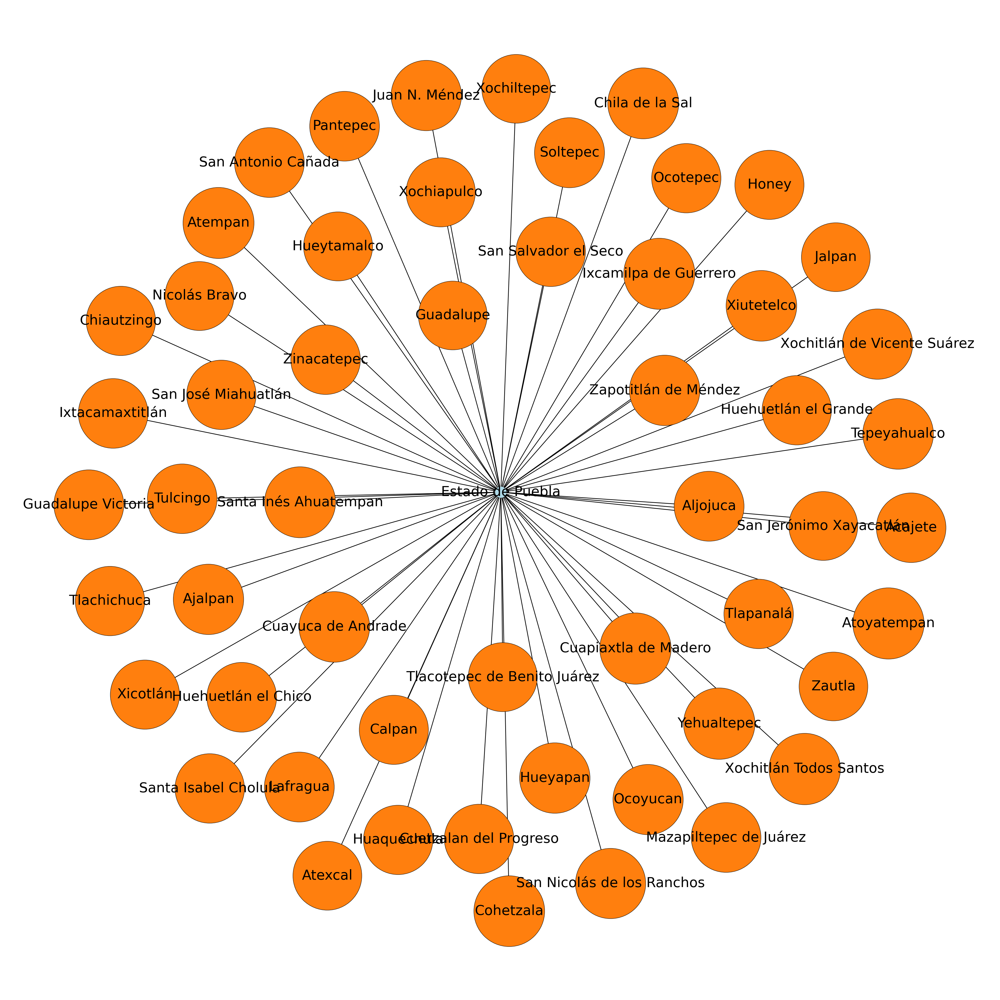

In [166]:
f = plt.figure(figsize=(40,40))
f.tight_layout() 
pos = nx.spring_layout(Reg_3, iterations=100, seed=39775)

nx.draw(Reg_3, pos,
        nodelist=regp_3, node_color="tab:orange", with_labels  = True,
        node_size=[vals_3[i] for i in range(len(vals_3))],
        edgecolors= 'black'
       ,width = 2,
       font_size = 40)
nx.draw_networkx_nodes(Reg_3,pos, nodelist = ['Estado de Puebla'], node_color = "lightblue", node_size = 1000)


plt.savefig("puebla_3.jpeg")

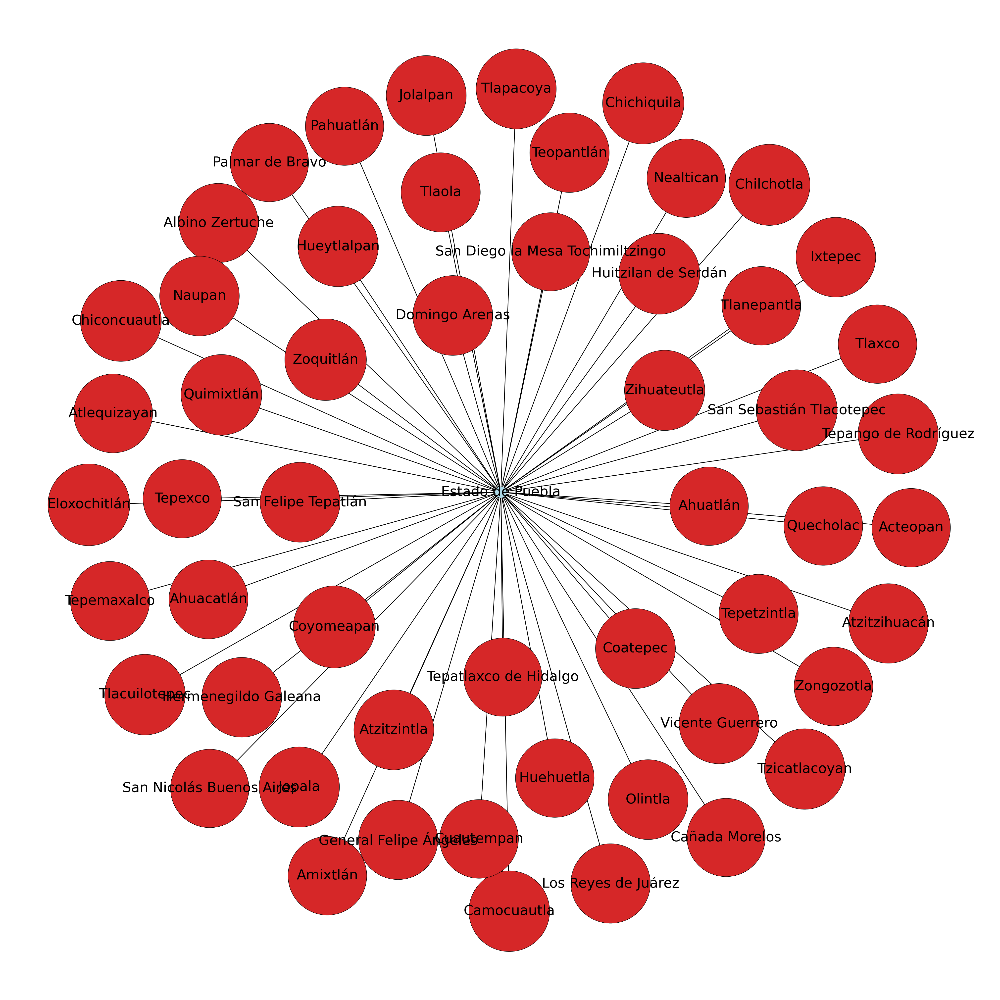

In [167]:
f = plt.figure(figsize=(40,40))
f.tight_layout() 
pos = nx.spring_layout(Reg_4, iterations=100, seed=39775)

nx.draw(Reg_4, pos,
        nodelist=regp_4, node_color="tab:red", with_labels  = True,
        node_size=[vals_4[i] for i in range(len(vals_4))],
        edgecolors= 'black'
       ,width = 2,
       font_size = 40)
nx.draw_networkx_nodes(Reg_4,pos, nodelist = ['Estado de Puebla'], node_color = "lightblue", node_size = 1000)


plt.savefig("puebla4.jpeg")